<a href="https://colab.research.google.com/github/VeereshElango/CalifornianHousingDatasetAnalysis/blob/master/California_House_Price_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

![CaliforniaHousing](https://source.unsplash.com/-Ey_0PMz900/1600x500)


# Goal



Given the provided dataset, use statistical methods and machine learning algorithms to explore the dataset and build a model that predicts house prices in California.

# Load data

In [0]:
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

In [0]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from matplotlib import style
import seaborn as sns
%matplotlib inline

In [0]:

%matplotlib inline  
style.use('fivethirtyeight') 
sns.set(style='whitegrid',color_codes=True)

In [0]:
df = pd.read_csv("https://raw.githubusercontent.com/VeereshElango/CalifornianHousingDatasetAnalysis/master/californiahousing.csv", index_col=0)

In [5]:
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,total_pools,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,11,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,150,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,17,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,23,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,32,565.0,259.0,3.8462,342200.0,NEAR BAY


After importing the dataset, we need to understand with what kind of data that we are dealing with.

# Dating with Data


<img width="1600" height="500" src="https://source.unsplash.com/KgLtFCgfC28">

If dating is all about understanding each other, then this section is for that. 

## What variables do we have?

In [6]:
df.dtypes

longitude             float64
latitude              float64
housing_median_age    float64
total_rooms           float64
total_bedrooms        float64
total_pools             int64
population            float64
households            float64
median_income         float64
median_house_value    float64
ocean_proximity        object
dtype: object

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20640 entries, 0 to 20639
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   total_pools         20640 non-null  int64  
 6   population          20640 non-null  float64
 7   households          20640 non-null  float64
 8   median_income       20640 non-null  float64
 9   median_house_value  20640 non-null  float64
 10  ocean_proximity     20640 non-null  object 
dtypes: float64(9), int64(1), object(1)
memory usage: 1.9+ MB


We have 
*   20640 entries
*   Geo-spatial information 
*   7 numerical features
*   1 categorical feature
*   1 numerical target variable

## Are they enough?

Is this enough to predict the our target variable **median_house_value** ?
That's the question to SME (Subject Matter Expert).


In our case, we will consider they are enough and proceed

## Data Quality

<img width="1200" height="300" src="https://source.unsplash.com/2FPjlAyMQTA">

### Is there any missing values?

In [8]:
df.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
total_pools             0
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

Yes, we have one column **total bedrooms** with  207 missing values.

### What's your shape?

In [9]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,total_pools,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,49.457946,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,42.641988,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,0.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,24.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,39.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,61.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,890.000000,35682.000000,6082.000000,15.000100,500001.000000


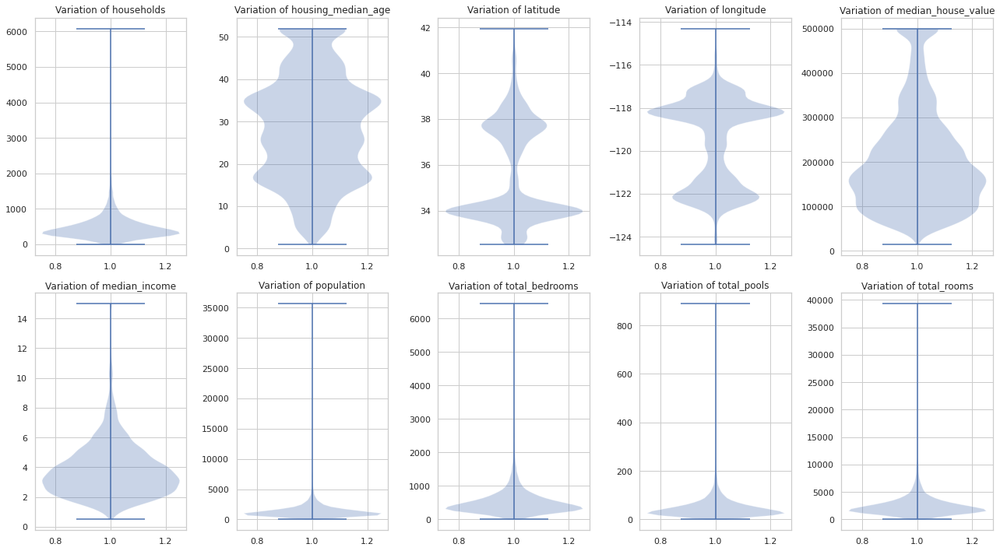

In [10]:
df_without_null = df.dropna(axis=0)
fig,axes=plt.subplots(2,5)
columns= df_without_null.drop("ocean_proximity",axis=1).columns.sort_values().tolist()

c = 0
for i in range (2):
    for j in range (5):
        axes[i,j].violinplot(df_without_null[columns[c]])
        axes[i,j].set_title('Variation of '+columns[c])
        c+=1
fig=plt.gcf()
fig.set_size_inches(18,10)
fig.tight_layout()

**households**, **population**, **total_bedrooms**, **total_pools**, **total_rooms** has some extreme values which are out of their nature.

Coming to our target variable **median_house_value**, looks logical. The distribution of house prices are denser in mid-range values than high-range values.

### Relationship between features and target variable

#### Numerical features

We will start with numerical features and target variable.

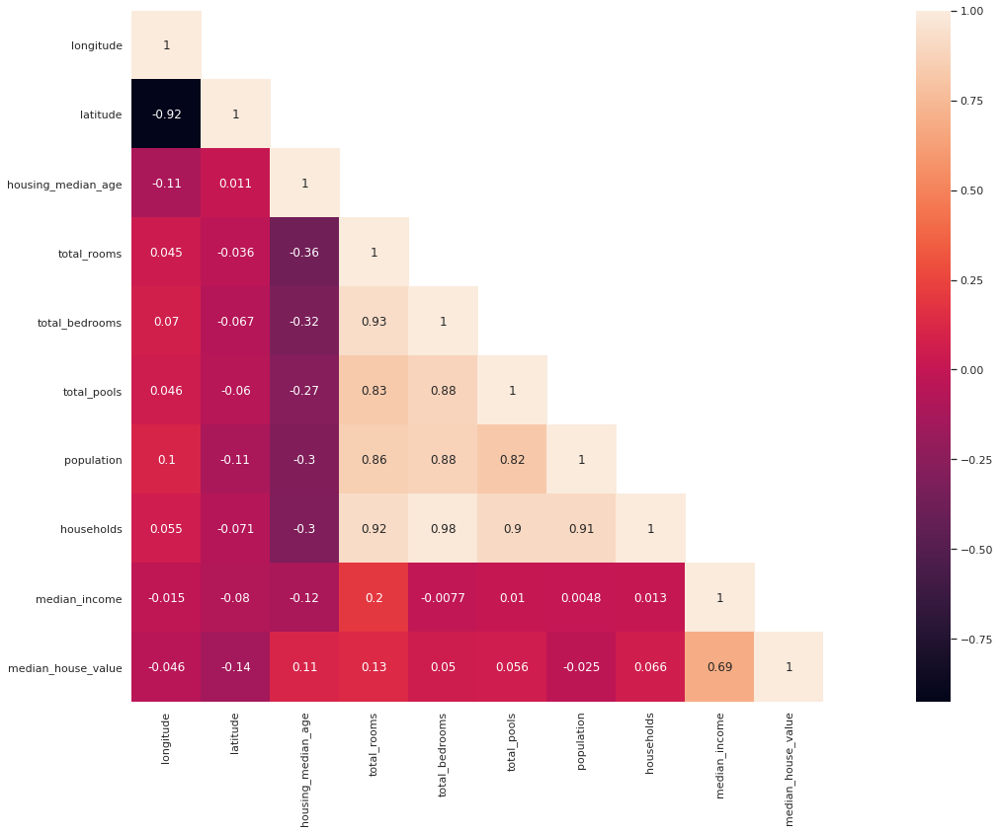

In [11]:
cor_mat= df.corr()
mask = np.array(cor_mat)
mask[np.tril_indices_from(mask)] = False
fig=plt.gcf()
fig.set_size_inches(30,12)
sns.heatmap(data=cor_mat,mask=mask,square=True,annot=True,cbar=True)

**median_house_value** & **median_income** has pearson correlation on 0.69. So, we have one good correlating feature. 


Among rest of the features, **households** has >=0.90 correlation with **total_rooms**, **total_bedrooms**, **total_pools** & **population**. That's logical but it is redundant to have highly correlated features.


#### Categorical features

One last, let's check whether distribution of **median_house_value** has clear seperation with categorical variable **ocean_proximity**. 

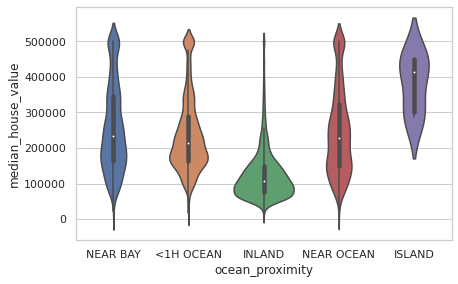

In [12]:
sns.violinplot(x="ocean_proximity", y="median_house_value", data=df)

Except _ISLAND_ category all other categories has values distributed all over the range. Well, _INLAND_ has most values in under 200,000 with some exceptions.

So, no clear segregation based on categorical variable.

In [13]:
import folium
from folium import Circle

# Create a base map
map_to_plot = folium.Map(location=[38.481380, -115.758344], tiles='cartodbpositron', zoom_start=6)

def color_producer(val):
    if val == "NEAR BAY":
        return 'green'
    elif val == "<1H OCEAN":
        return "blue"
    elif val == "INLAND":
        return "red"
    elif val == "NEAR OCEAN":
        return "yellow"
    else:
        return 'black'

# Add a bubble map to the base map
for i in range(0,len(df)):
    Circle(
        location=[df.iloc[i]['latitude'], df.iloc[i]['longitude']],
        radius= 50,
        color=color_producer(df.iloc[i]['ocean_proximity']),
        opacity = 0.5
        ).add_to(map_to_plot)

# Display the map
map_to_plot

# Strategy

At this point, we understood what needs to fixed in data and may be some ideas for feature engineering. 


## Should we start with data pre-processing and feature engineering?

There are _n_ number of ways you could treat the data which may or may not affect our result. 
Yes, we have to do data pre-processing and feature engineering but more in an Agile way.

## What do we mean by Agile way?

<img align="left" width="200" height="150" src="https://miro.medium.com/max/470/0*65DbU_Hc5fBMIrbO.png">


We will start with simple data pre-processing & feature engineering methods, to create a model in an end-to-end fashion. Then, we will improve it iteratively. 

By doing this way, we have some reuslts to compare our _eureka_ moments with data preparaion, feature engineering or new model design. 

In real-time, we should discuss with cutomers about our strategy and discuss with at the end of every iteration.

## Evaluation

We need fix our evaluation method for all our iterations because we don't want to compare _Apples_ & _Oranges_.

### Metric
We are dealing with regression problem. For this usecase, we will go with [RMSE(Root Mean Square Error)  ](https://en.wikipedia.org/wiki/Root-mean-square_deviation). In RMSE, 0 indicates perfect value. 


$$RMSE = \sqrt{(\frac{1}{n})\sum_{i=1}^{n}(y_{i} - x_{i})^{2}}$$

In [0]:
from sklearn.metrics import mean_squared_error


class TestEvaluation:
    def __init__(self,model):
        self.model = model
    def test_score (self, X_test, y_test):
        y_pred = self.model.predict(X_test)
        return mean_squared_error(y_test, y_pred, squared=False)


In real-time, we should verify our evalution policy with SME's before beginning our model development.

### Common train & test

In [0]:
from sklearn.model_selection import StratifiedShuffleSplit

We need to predict the house price in California and we noticed that we have samples from all over the region. So we have to make sure that we samples from all regions in both train and test.

In [16]:
split=StratifiedShuffleSplit(n_splits=1,test_size=0.2,random_state=42)
for train_index,test_index in split.split(df,df['ocean_proximity']):
    train_index = train_index
    test_index = test_index

print("Number of samples in train are {} & test are {}".format(len(train_index), len(test_index)))
tr_tst_split = pd.concat([
           df.loc[train_index].ocean_proximity.value_counts(),
           df.loc[test_index].ocean_proximity.value_counts()
],
axis=1)
tr_tst_split.columns = ["train","test"]
tr_tst_split

Number of samples in train are 16512 & test are 4128


,train,test
<1H OCEAN,7309,1827
INLAND,5241,1310
NEAR OCEAN,2126,532
NEAR BAY,1832,458
ISLAND,4,1


### Evaluation Utility

In [0]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.pipeline import Pipeline, FeatureUnion

In [0]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor

In [0]:
class EstimatorSelectionHelper:
    COLUMNS = ['estimator', 'min_score', 'mean_score', 'max_score', 'std_score']

    def __init__(self, models, params, pipeline=None):
        if not set(models.keys()).issubset(set(params.keys())):
            missing_params = list(set(models.keys()) - set(params.keys()))
            raise ValueError("Some estimators are missing parameters: %s" % missing_params)
        self.models = models
        self.params = params
        self.keys = models.keys()
        self.grid_searches = {}
        self.pipeline=pipeline
        self.result_df = None
        

    def fit(self, X, y, cv=3, n_jobs=3, verbose=1, scoring=None, refit=False):
        self.update_params()
        for key in self.keys:
            print("Running GridSearchCV for %s." % key)
            model = self.models[key]
            params = self.params[key]
            pipeline_steps = []            
            if self.pipeline is not None:
                pipeline_steps = pipeline_steps + self.pipeline
            pipeline_steps.append((key, model))
            pipeline = Pipeline(pipeline_steps)
            gs = GridSearchCV(pipeline, params, cv=cv, n_jobs=n_jobs,
                              verbose=verbose, scoring=scoring, refit=refit,
                              return_train_score=True)
            gs.fit(X,y)
            self.scoring = scoring
            self.grid_searches[key] = gs    
    
    def update_params(self):
        key_params = {}
        for key, param in self.params.items():
            params = {}
            for p_key, p_value in param.items():
                params[key+"__"+p_key] = p_value
            key_params[key] = params
        self.params = key_params

    def score_summary(self, sort_by='mean_score'):
        def row(key, scores, params):
            d = {
                 'estimator': key,
                 'min_score': min(scores),
                 'max_score': max(scores),
                 'mean_score': np.mean(scores),
                 'std_score': np.std(scores),
            }
            return pd.Series({**params,**d})

        rows = []
        for k in self.grid_searches:
            params = self.grid_searches[k].cv_results_['params']
            scores = []
            for i in range(self.grid_searches[k].cv):
                key = "split{}_test_score".format(i)
                r = self.grid_searches[k].cv_results_[key]        
                scores.append(r.reshape(len(params),1))

            all_scores = np.hstack(scores)
            if self.scoring =="neg_mean_squared_error":
                all_scores =np.sqrt(-all_scores)
            for p, s in zip(params,all_scores):
                rows.append((row(k, s, p)))

        df = pd.concat(rows, axis=1).T.sort_values([sort_by], ascending=False)
        
        columns = EstimatorSelectionHelper.COLUMNS 
        columns = columns + [c for c in df.columns if c not in columns]
        self.result_df = df[columns]
        return self.result_df

    def best_estimator(self,estimator):
        return self.grid_searches[estimator].best_estimator_

    def plot_results(self, by):
        df = self.result_df.reset_index(drop=True).reset_index()
        param_columns = [ col for col in df.columns if col not in EstimatorSelectionHelper.COLUMNS]
        fig= px.scatter(df, x="index", y=by, color="estimator", hover_data=param_columns )
        fig.show()



### Models & Parameters

We will use standard set of models and parameters for all our iterations. At any point, we can include or remove depending our idea for our iteration.

In [0]:
models = {
    'LinearRegression': LinearRegression(),
    'Ridge': Ridge(),
    'RandomForestRegressor': RandomForestRegressor(),
     'GradientBoostingRegressor': GradientBoostingRegressor()
}

params = {
    'LinearRegression': {  },
    'Ridge': { 'alpha': [1,10,50,100,200,300,500] },
    'RandomForestRegressor':{ 'n_estimators' : [100, 250]},
    'GradientBoostingRegressor':{
        'n_estimators':[500,1000]
    }    
}

# Iteration I - Base model - RMSE: 82k

**median_income** has highest correlation with target variable **median_house_value**. 

So, we will create our simple model with just one feature and then we will include other features step by step. 

## Data preparation

In [0]:
x_train = df.loc[train_index][["median_income"]]
y_train = df.loc[train_index][["median_house_value"]]
x_test = df.loc[test_index][["median_income"]]
y_test = df.loc[test_index][["median_house_value"]]

## Model Development

In [22]:
helper = EstimatorSelectionHelper(models, params)
helper.fit(x_train,y_train, scoring="neg_mean_squared_error", n_jobs=-1, cv=5, refit=True)
results =helper.score_summary(sort_by='mean_score')
helper.plot_results("mean_score")
results

Running GridSearchCV for LinearRegression.
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Running GridSearchCV for Ridge.
Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=-1)]: Done  35 out of  35 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Running GridSearchCV for RandomForestRegressor.
Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   33.5s finished


Running GridSearchCV for GradientBoostingRegressor.
Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   39.3s finished


,estimator,min_score,mean_score,max_score,std_score,Ridge__alpha,RandomForestRegressor__n_estimators,GradientBoostingRegressor__n_estimators
8,RandomForestRegressor,96418.5,97094.6,98685,808.319,NaN,100,NaN
9,RandomForestRegressor,96381.7,96976.2,98512.7,776.385,NaN,250,NaN
11,GradientBoostingRegressor,83615.6,85067.1,87353.6,1237.61,NaN,NaN,1000
7,Ridge,82691.3,84153.3,86719.3,1411.97,500,NaN,NaN
6,Ridge,82677.9,84150.9,86720.5,1415.97,300,NaN,NaN
5,Ridge,82671.7,84150.2,86721.5,1418.02,200,NaN,NaN
4,Ridge,82665.8,84149.8,86722.9,1420.09,100,NaN,NaN
0,LinearRegression,82660.1,84149.8,86724.7,1422.19,NaN,NaN,NaN
1,Ridge,82660.1,84149.8,86724.6,1422.17,1,NaN,NaN
2,Ridge,82660.6,84149.7,86724.5,1421.98,10,NaN,NaN


In [23]:
optimised_model = helper.best_estimator("GradientBoostingRegressor")
print(optimised_model)
test_score = TestEvaluation(optimised_model).test_score(x_test, y_test)
print("Test dataset - RMSE score : ",test_score)

Pipeline(memory=None,
         steps=[('GradientBoostingRegressor',
                 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0,
                                           criterion='friedman_mse', init=None,
                                           learning_rate=0.1, loss='ls',
                                           max_depth=3, max_features=None,
                                           max_leaf_nodes=None,
                                           min_impurity_decrease=0.0,
                                           min_impurity_split=None,
                                           min_samples_leaf=1,
                                           min_samples_split=2,
                                           min_weight_fraction_leaf=0.0,
                                           n_estimators=500,
                                           n_iter_no_change=None,
                                           presort='deprecated',
                                         

Not bad to start with. Let's improve!

# Iteration II - Numerical features & Imputing - RMSE : 48.2K

Now, we will include only the **numerical features** and fix the missing values with median.

## Data preparation

In [0]:
x_train = df.loc[train_index].drop(["ocean_proximity","median_house_value"], axis=1)
y_train = df.loc[train_index][["median_house_value"]]
x_test = df.loc[test_index].drop(["ocean_proximity","median_house_value"], axis=1)
y_test = df.loc[test_index][["median_house_value"]]

## Model development

In [0]:
pipeline = [
     ('imputer', SimpleImputer(strategy="median"))
    ]

In [26]:
helper = EstimatorSelectionHelper(models, params, pipeline)
helper.fit(x_train,y_train, scoring="neg_mean_squared_error", n_jobs=-1, cv=5, refit=True)
results=helper.score_summary(sort_by='mean_score')
helper.plot_results("mean_score")
results

Running GridSearchCV for LinearRegression.
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Running GridSearchCV for Ridge.
Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  35 out of  35 | elapsed:    0.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Running GridSearchCV for RandomForestRegressor.
Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:  2.2min finished


Running GridSearchCV for GradientBoostingRegressor.
Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:  2.7min finished


,estimator,min_score,mean_score,max_score,std_score,Ridge__alpha,RandomForestRegressor__n_estimators,GradientBoostingRegressor__n_estimators
7,Ridge,67515.8,70079,73684,2020.05,500,NaN,NaN
6,Ridge,67409.3,70018.1,73631.5,2033.16,300,NaN,NaN
5,Ridge,67364.2,69996.9,73613.5,2039.48,200,NaN,NaN
4,Ridge,67326,69983.3,73602.3,2045.57,100,NaN,NaN
3,Ridge,67310,69979.9,73599.7,2048.51,50,NaN,NaN
0,LinearRegression,67296.2,69978.9,73599.2,2051.36,NaN,NaN,NaN
1,Ridge,67296.4,69978.9,73599.2,2051.3,1,NaN,NaN
2,Ridge,67298.7,69978.9,73599.1,2050.8,10,NaN,NaN
8,RandomForestRegressor,48710.9,50087,50912,804.895,NaN,100,NaN
9,RandomForestRegressor,48584.5,50030.5,50970.2,831.148,NaN,250,NaN


In [28]:
optimised_model= helper.best_estimator("GradientBoostingRegressor")
print(optimised_model)
test_score = TestEvaluation(optimised_model).test_score(x_test, y_test)
print("Test dataset - RMSE score : ",test_score)

Pipeline(memory=None,
         steps=[('imputer',
                 SimpleImputer(add_indicator=False, copy=True, fill_value=None,
                               missing_values=nan, strategy='median',
                               verbose=0)),
                ('GradientBoostingRegressor',
                 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0,
                                           criterion='friedman_mse', init=None,
                                           learning_rate=0.1, loss='ls',
                                           max_depth=3, max_features=None,
                                           max_leaf_nodes=None,
                                           min_impurity_decrease=0.0,
                                           min_impurity_split=None,
                                           min_samples_leaf=1,
                                           min_samples_split=2,
                                           min_weight_fraction_leaf=0.0,
           

# Iteration III - St., Scaler - RMSE :  48.1K

While dealing with numerical features, it is better to scale the data so that its distribution will have a mean value 0 and standard deviation of 1.

## Data preparation

In [0]:
x_train = df.loc[train_index].drop(["ocean_proximity","median_house_value"], axis=1)
y_train = df.loc[train_index][["median_house_value"]]
x_test = df.loc[test_index].drop(["ocean_proximity","median_house_value"], axis=1)
y_test = df.loc[test_index][["median_house_value"]]

## Model development

In [30]:
pipeline = [
     ('imputer', SimpleImputer(strategy="median")),
     ('scaler', StandardScaler() )
    ]

helper = EstimatorSelectionHelper(models, params, pipeline)
helper.fit(x_train,y_train, scoring="neg_mean_squared_error", n_jobs=-1, cv=5, refit=True)
results =helper.score_summary(sort_by='mean_score')
helper.plot_results("mean_score")
results

Running GridSearchCV for LinearRegression.
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Running GridSearchCV for Ridge.
Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  35 out of  35 | elapsed:    1.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Running GridSearchCV for RandomForestRegressor.
Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:  2.2min finished


Running GridSearchCV for GradientBoostingRegressor.
Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:  2.7min finished


,estimator,min_score,mean_score,max_score,std_score,Ridge__alpha,RandomForestRegressor__n_estimators,GradientBoostingRegressor__n_estimators
7,Ridge,69067.9,71095.8,73850.7,1552.78,500,NaN,NaN
6,Ridge,68272.3,70495.2,73505.6,1700.88,300,NaN,NaN
5,Ridge,67888.9,70236.8,73413.4,1796.79,200,NaN,NaN
4,Ridge,67546.7,70045,73422.1,1912.04,100,NaN,NaN
3,Ridge,67405.3,69991,73483.6,1978.34,50,NaN,NaN
0,LinearRegression,67296.2,69978.9,73599.2,2051.36,NaN,NaN,NaN
1,Ridge,67298,69978.7,73596.3,2049.83,1,NaN,NaN
2,Ridge,67314.8,69977.3,73571,2036.17,10,NaN,NaN
8,RandomForestRegressor,48761.1,50238.6,51218.3,880.871,NaN,100,NaN
9,RandomForestRegressor,48328.8,49936.9,50660.8,871.659,NaN,250,NaN


In [31]:
optimised_model = helper.best_estimator("GradientBoostingRegressor")
print(optimised_model)
test_score = TestEvaluation(optimised_model).test_score(x_test, y_test)
print("Test dataset - RMSE score : ",test_score)

Pipeline(memory=None,
         steps=[('imputer',
                 SimpleImputer(add_indicator=False, copy=True, fill_value=None,
                               missing_values=nan, strategy='median',
                               verbose=0)),
                ('scaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('GradientBoostingRegressor',
                 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0,
                                           criterion='friedman_mse', init=None,
                                           learning_rate=0.1, loss='ls',
                                           max_depth=3, max_features=None,
                                           max_leaf_nodes=None,
                                           min_impurity_decrease=0.0,
                                           min_impurity_split=None,
                                           min_samples_leaf=1,
                                           mi

Very little, but improvement is improvement. Let's continue.

# Iteration IV - One hot encoding - RMSE: 48.6K 

Let's include our categorical variable and encode it using a one hot encoding method.

## Feature engineering

In [0]:
x_train = df.loc[train_index].drop(["median_house_value"], axis=1)
y_train = df.loc[train_index][["median_house_value"]]
x_test = df.loc[test_index].drop(["median_house_value"], axis=1)
y_test = df.loc[test_index][["median_house_value"]]

In [0]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.base import BaseEstimator, TransformerMixin

#Custom Transformer that extracts columns passed as argument to its constructor 
class FeatureSelector( BaseEstimator, TransformerMixin ):
    #Class Constructor 
    def __init__( self, feature_names ):
        self._feature_names = feature_names 
    
    #Return self nothing else to do here    
    def fit( self, X, y = None ):
        return self 
    
    #Method that describes what we need this transformer to do
    def transform( self, X, y = None ):
        return X[ self._feature_names ] 

## Data preparation

In [0]:

#Categrical features to pass down the categorical pipeline 
categorical_features = ["ocean_proximity"]

#Numerical features to pass down the numerical pipeline 
numerical_features = ['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'total_pools', 'population', 'households',
       'median_income']

numerical_pipeline = Pipeline([
                ( 'num_selector', FeatureSelector(numerical_features) ),
                ('imputer', SimpleImputer(strategy="median")),
                ('scaler', StandardScaler() )
    ]
)
categorical_pipeline = Pipeline([ 
                        ( 'cat_selector', FeatureSelector(categorical_features) ),
                        ("encoding", OneHotEncoder())
])


#Combining numerical and categorical piepline into one full big pipeline horizontally 
#using FeatureUnion
data_processing_pipeline = FeatureUnion(
     transformer_list = [
                         ( 'categorical_pipeline', categorical_pipeline ), 
                         ( 'numerical_pipeline', numerical_pipeline )
                         ]
)

#Can call fit on it just like any other pipeline

x_train_transformed = pd.DataFrame(data_processing_pipeline.fit_transform(x_train).toarray())
x_test_transformed = pd.DataFrame(data_processing_pipeline.transform(x_test).toarray())


## Model development

In [35]:

helper = EstimatorSelectionHelper(models, params)
helper.fit(x_train_transformed, y_train, scoring="neg_mean_squared_error", n_jobs=-1, cv=5, refit=True)
results = helper.score_summary(sort_by='mean_score')
helper.plot_results("mean_score")
results

Running GridSearchCV for LinearRegression.
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Running GridSearchCV for Ridge.
Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  35 out of  35 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Running GridSearchCV for RandomForestRegressor.
Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:  2.4min finished


Running GridSearchCV for GradientBoostingRegressor.
Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:  2.9min finished


,estimator,min_score,mean_score,max_score,std_score,Ridge__alpha,RandomForestRegressor__n_estimators,GradientBoostingRegressor__n_estimators
7,Ridge,67237.1,69475.8,72112.9,1577.61,500,NaN,NaN
6,Ridge,66854.6,69227.7,72080,1696.37,300,NaN,NaN
5,Ridge,66660.2,69120.8,72124.8,1777.53,200,NaN,NaN
4,Ridge,66467.9,69037.3,72240.1,1881.56,100,NaN,NaN
3,Ridge,66377.4,69010.8,72337.9,1945.03,50,NaN,NaN
2,Ridge,66312.8,68990.4,72425.2,1996.36,10,NaN,NaN
0,LinearRegression,66299.3,68964.6,72393.4,1990.74,NaN,NaN,NaN
1,Ridge,66300.4,68963.4,72403.2,1993.91,1,NaN,NaN
8,RandomForestRegressor,47971.6,49775.5,50515.4,926.606,NaN,100,NaN
9,RandomForestRegressor,47659.9,49492.5,50311.2,945.327,NaN,250,NaN


In [36]:
optimised_model = helper.best_estimator("RandomForestRegressor")
print(optimised_model)
test_score = TestEvaluation(optimised_model).test_score(x_test_transformed, y_test)
print("Test dataset - RMSE score : ",test_score)

Pipeline(memory=None,
         steps=[('RandomForestRegressor',
                 RandomForestRegressor(bootstrap=True, ccp_alpha=0.0,
                                       criterion='mse', max_depth=None,
                                       max_features='auto', max_leaf_nodes=None,
                                       max_samples=None,
                                       min_impurity_decrease=0.0,
                                       min_impurity_split=None,
                                       min_samples_leaf=1, min_samples_split=2,
                                       min_weight_fraction_leaf=0.0,
                                       n_estimators=250, n_jobs=None,
                                       oob_score=False, random_state=None,
                                       verbose=0, warm_start=False))],
         verbose=False)
Test dataset - RMSE score :  48661.41152780216


Categorical variables inclusion didn't helped us to improve the results. Let's try with Geo-spation information.

# Iteration V - Grid features - RMSE: 48.6K

## Feature engineering

### Dense areas 

Generally, households at city are costlier and densely populated.Let's see if that correlation is in this dataset

In [37]:
df.corr(method="pearson")["median_house_value"].sort_values(ascending=False)

median_house_value    1.000000
median_income         0.688075
total_rooms           0.134153
housing_median_age    0.105623
households            0.065843
total_pools           0.055536
total_bedrooms        0.049686
population           -0.024650
longitude            -0.045967
latitude             -0.144160
Name: median_house_value, dtype: float64

**households** are not having a great correlation with **median_house_value**. Hence, let's try to create add a feature for that

In [0]:
get_grid = lambda lat,long,deg=20:round(360 * deg * round(deg*lat) + round(deg*long))

In [0]:
sample_df = df.copy()

In [0]:
sample_df["grid"] = sample_df.apply(lambda row: get_grid(row["latitude"], row["longitude"],1), axis=1)

In [41]:
len(sample_df.grid.unique())

57

In [0]:
grid_features = (
    pd.merge(
        sample_df,
        sample_df.grid.value_counts().reset_index(name="no_of_samples_in_grid"),
        how="left",
        left_on="grid",
        right_on="index"
    )
).drop(["index"],axis=1)


In [43]:
grid_features.corr(method="pearson")["median_house_value"].sort_values(ascending=False)

median_house_value       1.000000
median_income            0.688075
no_of_samples_in_grid    0.266743
total_rooms              0.134153
housing_median_age       0.105623
households               0.065843
total_pools              0.055536
total_bedrooms           0.049686
population              -0.024650
longitude               -0.045967
latitude                -0.144160
grid                    -0.150994
Name: median_house_value, dtype: float64

Great, now we have a density feature which has good correlation with **median_house_value**.

### Adding more grid related features

In [0]:
grid_features = pd.merge(
    grid_features,
    grid_features.groupby("grid")[["total_rooms","total_pools","total_bedrooms","population","latitude","longitude"]].quantile(0.5).reset_index(),
    on="grid",suffixes=('','_grid')
)

In [45]:
grid_features.corr(method="pearson")["median_house_value"].sort_values(ascending=False)

median_house_value       1.000000
median_income            0.688075
no_of_samples_in_grid    0.266743
population_grid          0.175055
total_pools_grid         0.172060
total_rooms              0.134153
housing_median_age       0.105623
total_rooms_grid         0.077281
households               0.065843
total_bedrooms_grid      0.060080
total_pools              0.055536
total_bedrooms           0.049686
population              -0.024650
longitude_grid          -0.033981
longitude               -0.045967
latitude_grid           -0.134654
latitude                -0.144160
grid                    -0.150994
Name: median_house_value, dtype: float64

_no_of_samples_in_grid_, _population_grid_, _total_pools_grid_ has better correlation. 

Let's embed it in the pipeline.

## Data preparation

In [0]:
x_train = df.loc[train_index].drop(["median_house_value","ocean_proximity"], axis=1)
y_train = df.loc[train_index][["median_house_value"]]
x_test = df.loc[test_index].drop(["median_house_value","ocean_proximity"], axis=1)
y_test = df.loc[test_index][["median_house_value"]]

## Model development

In [70]:
from sklearn.base import BaseEstimator, TransformerMixin

class GridFeatures( BaseEstimator, TransformerMixin ):
    def __init__(self, degree):
        self.grid_features = None
        self.degree = degree
    def get_grid(self,lat,long):
        return round(360 * self.degree * round(self.degree *lat) + round(self.degree *long))
    def fit(self, X, y = None ):
        X["grid"] = X.apply(lambda row: self.get_grid(row["latitude"], row["longitude"]), axis=1)
        self.grid_features = pd.merge(
            X.groupby("grid")[["total_rooms","total_pools","total_bedrooms","population","latitude","longitude"]].quantile(0.5).reset_index(),
            X.grid.value_counts().reset_index(name="no_of_samples_in_grid"),
            left_on="grid",
            right_on="index"
        ).drop(["index"],axis=1)
        return self
        
    def transform(self, X, y = None ):
        X["grid"] = X.apply(lambda row: self.get_grid(row["latitude"], row["longitude"]), axis=1)
        print(len(X))
        grid_features = pd.merge(
            X,
            self.grid_features,
            how="left",
            on="grid",suffixes=('','_grid')
        ).drop(["grid"],axis=1)
        grid_features = grid_features.fillna(value=self.get_fillna_values())
        return grid_features
    
    def get_fillna_values(self):
        value = {}
        for k, v in self.grid_features.drop("grid",axis=1).quantile(0.5).to_dict().items():
            if "_grid" not in k:
                value[k+"_grid"] = v
            else:
                value[k] = v
        return value

gs = GridFeatures(degree=10)
x_train_transformed = gs.fit_transform(x_train.reset_index(drop=True))
x_test_transformed = gs.transform(x_test.reset_index(drop=True))

16512
4128


In [71]:
pipeline = [
     ('imputer', SimpleImputer(strategy="median")),
     ('scaler', StandardScaler() )
    ]

helper = EstimatorSelectionHelper(models, params, pipeline)
helper.fit(x_train_transformed,y_train, scoring="neg_mean_squared_error", n_jobs=-1, cv=5, refit=True)
results = helper.score_summary(sort_by='mean_score')
helper.plot_results("mean_score")
results

Running GridSearchCV for LinearRegression.
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Running GridSearchCV for Ridge.
Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=-1)]: Done  35 out of  35 | elapsed:    1.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Running GridSearchCV for RandomForestRegressor.
Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:  3.3min finished


Running GridSearchCV for GradientBoostingRegressor.
Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:  4.1min finished


,estimator,min_score,mean_score,max_score,std_score,Ridge__alpha,RandomForestRegressor__n_estimators,GradientBoostingRegressor__n_estimators
7,Ridge,67297.8,70287.3,75485.3,2742.94,500,NaN,NaN
6,Ridge,66852.1,70043.5,75617.6,2939.8,300,NaN,NaN
5,Ridge,66650.2,69956.9,75739.1,3049.58,200,NaN,NaN
4,Ridge,66474.5,69909.2,75917.4,3169.66,100,NaN,NaN
3,Ridge,66400.5,69905.5,76037.3,3235.59,50,NaN,NaN
2,Ridge,66340.2,69904.2,76144,3292.92,10,NaN,NaN
1,Ridge,66284.3,69846.3,76109.1,3302.44,1,NaN,NaN
0,LinearRegression,66287.9,69823.3,76076.6,3293.65,NaN,NaN,NaN
8,RandomForestRegressor,48517.5,49659.6,50301.3,639.297,NaN,100,NaN
9,RandomForestRegressor,48193.3,49466.9,50107.8,688.394,NaN,250,NaN


In [72]:
optimised_model = helper.best_estimator("GradientBoostingRegressor")
print(optimised_model)
test_score = TestEvaluation(optimised_model).test_score(x_test_transformed, y_test)
print("Test dataset - RMSE score : ",test_score)

Pipeline(memory=None,
         steps=[('imputer',
                 SimpleImputer(add_indicator=False, copy=True, fill_value=None,
                               missing_values=nan, strategy='median',
                               verbose=0)),
                ('scaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('GradientBoostingRegressor',
                 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0,
                                           criterion='friedman_mse', init=None,
                                           learning_rate=0.1, loss='ls',
                                           max_depth=3, max_features=None,
                                           max_leaf_nodes=None,
                                           min_impurity_decrease=0.0,
                                           min_impurity_split=None,
                                           min_samples_leaf=1,
                                           mi

# Iteration VI - Features per household - RMSE: 47.3K

Let's create some features using **households** feature.

## Feature engineering

In [0]:
from sklearn.base import BaseEstimator, TransformerMixin

class FeaturesPerHousehold( BaseEstimator, TransformerMixin ):
    def __init__(self, columns, household_col):
        self.columns = columns
        self.household_col = household_col

    def fit(self, X, y = None ):
        return self
        
    def transform(self, X, y = None ):
        for col in self.columns:
            X[col+"_per_"+self.household_col] = X[col]/X[self.household_col]
        return X

columns = [
           'total_rooms',
           'total_bedrooms', 
           'total_pools', 
           'population'
           ]



## Dataset preparation

In [0]:
x_train = df.loc[train_index].drop(["ocean_proximity","median_house_value"], axis=1)
y_train = df.loc[train_index][["median_house_value"]]
x_test = df.loc[test_index].drop(["ocean_proximity","median_house_value"], axis=1)
y_test = df.loc[test_index][["median_house_value"]]

fph = FeaturesPerHousehold(columns, 'households')
x_train_transformed = fph.fit_transform(x_train.reset_index(drop=True))
x_test_transformed = fph.transform(x_test.reset_index(drop=True))

## Model development

In [52]:
pipeline = [
     ('imputer', SimpleImputer(strategy="median")),
     ('scaler', StandardScaler() )
    ]

helper = EstimatorSelectionHelper(models, params, pipeline)
helper.fit(x_train_transformed,y_train, scoring="neg_mean_squared_error", n_jobs=-1, cv=5, refit=True)
results =helper.score_summary(sort_by='mean_score')
helper.plot_results("mean_score")
results

Running GridSearchCV for LinearRegression.
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Running GridSearchCV for Ridge.
Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=-1)]: Done  35 out of  35 | elapsed:    1.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Running GridSearchCV for RandomForestRegressor.
Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:  3.3min finished


Running GridSearchCV for GradientBoostingRegressor.
Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:  4.6min finished


,estimator,min_score,mean_score,max_score,std_score,Ridge__alpha,RandomForestRegressor__n_estimators,GradientBoostingRegressor__n_estimators
7,Ridge,68716.9,70795.9,73384.2,1495.94,500,NaN,NaN
6,Ridge,67862.5,70211.6,72983.1,1633.53,300,NaN,NaN
5,Ridge,67449.5,69967.3,72856.3,1722.64,200,NaN,NaN
4,Ridge,67077.3,69795.7,72823.6,1830.65,100,NaN,NaN
0,LinearRegression,66798.1,69767.2,72952.9,1965.43,NaN,NaN,NaN
1,Ridge,66800.2,69766.4,72950.5,1963.9,1,NaN,NaN
2,Ridge,66819.4,69760,72929.6,1950.31,10,NaN,NaN
3,Ridge,66921.1,69756.5,72861.8,1893.88,50,NaN,NaN
8,RandomForestRegressor,50389.3,52045.6,53239.3,987.945,NaN,100,NaN
9,RandomForestRegressor,50178.4,51958.6,53193.7,1066.72,NaN,250,NaN


In [53]:
optimised_model = helper.best_estimator("GradientBoostingRegressor")
print(optimised_model)
test_score = TestEvaluation(optimised_model).test_score(x_test_transformed, y_test)
print("Test dataset - RMSE score : ",test_score)

Pipeline(memory=None,
         steps=[('imputer',
                 SimpleImputer(add_indicator=False, copy=True, fill_value=None,
                               missing_values=nan, strategy='median',
                               verbose=0)),
                ('scaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('GradientBoostingRegressor',
                 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0,
                                           criterion='friedman_mse', init=None,
                                           learning_rate=0.1, loss='ls',
                                           max_depth=3, max_features=None,
                                           max_leaf_nodes=None,
                                           min_impurity_decrease=0.0,
                                           min_impurity_split=None,
                                           min_samples_leaf=1,
                                           mi

Great!. Nice improvement. We all depend upon our own environment.

# Iteration VII - Dimensionality Reduction - RMSE: 65K 

As we noticed earlier, there were highly correlated features which means they are saying same thing. Let's try to reduce the features using PCA.

## Dataset preparation

In [0]:
x_train = df.loc[train_index].drop(["ocean_proximity","median_house_value"], axis=1)
y_train = df.loc[train_index][["median_house_value"]].values.ravel()
x_test = df.loc[test_index].drop(["ocean_proximity","median_house_value"], axis=1)
y_test = df.loc[test_index][["median_house_value"]].values.ravel()

fph = FeaturesPerHousehold(columns, 'households')
x_train_transformed = fph.fit_transform(x_train.reset_index(drop=True))
x_test_transformed = fph.transform(x_test.reset_index(drop=True))

## Model development

In [55]:
from sklearn.decomposition import PCA
pipeline = [
     ('imputer', SimpleImputer(strategy="median")),
     ('scaler', StandardScaler() ),
     ('pca', PCA(n_components=0.95))
    ]

helper = EstimatorSelectionHelper(models, params, pipeline)
helper.fit(x_train_transformed,y_train, scoring="neg_mean_squared_error", n_jobs=-1, cv=5, refit=True)
results =helper.score_summary(sort_by='mean_score')
helper.plot_results("mean_score")
results

Running GridSearchCV for LinearRegression.
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Running GridSearchCV for Ridge.
Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=-1)]: Done  35 out of  35 | elapsed:    1.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Running GridSearchCV for RandomForestRegressor.
Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:  2.2min finished


Running GridSearchCV for GradientBoostingRegressor.
Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:  3.4min finished


,estimator,min_score,mean_score,max_score,std_score,Ridge__alpha,RandomForestRegressor__n_estimators,GradientBoostingRegressor__n_estimators
7,Ridge,80603.6,81733.2,83284.4,938.273,500,NaN,NaN
6,Ridge,80558.5,81706.7,83247.9,937.906,300,NaN,NaN
5,Ridge,80541.6,81699.6,83235.6,937.746,200,NaN,NaN
0,LinearRegression,80519.6,81698.4,83223.8,937.491,NaN,NaN,NaN
1,Ridge,80519.7,81698.3,83223.8,937.492,1,NaN,NaN
2,Ridge,80520.3,81698,83224,937.501,10,NaN,NaN
3,Ridge,80523.5,81696.9,83225.1,937.546,50,NaN,NaN
4,Ridge,80528.5,81696.7,83227.5,937.607,100,NaN,NaN
10,GradientBoostingRegressor,67654.4,68834,71191.7,1265.9,NaN,NaN,500
11,GradientBoostingRegressor,67709.4,68833.7,71423.7,1366.99,NaN,NaN,1000


In [56]:
optimised_model = helper.best_estimator("RandomForestRegressor")
print(optimised_model)
test_score = TestEvaluation(optimised_model).test_score(x_test_transformed, y_test)
print("Test dataset - RMSE score : ",test_score)

Pipeline(memory=None,
         steps=[('imputer',
                 SimpleImputer(add_indicator=False, copy=True, fill_value=None,
                               missing_values=nan, strategy='median',
                               verbose=0)),
                ('scaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('pca',
                 PCA(copy=True, iterated_power='auto', n_components=0.95,
                     random_state=None, svd_solver='auto', tol=0.0,
                     whiten=False)),
                ('RandomForestRe...
                 RandomForestRegressor(bootstrap=True, ccp_alpha=0.0,
                                       criterion='mse', max_depth=None,
                                       max_features='auto', max_leaf_nodes=None,
                                       max_samples=None,
                                       min_impurity_decrease=0.0,
                                       min_impurity_split=None,
    

Eventhough we chose component with variance of 95%, the results are not improving.

# Iteration VIII - Top Cities distance - RMSE: 45.9K

World known logic behind housing price depends on where the house is, right! If we dig deeper, whether the house is nearby a city where everything is within reach or outside the city where not everything would be available in a reach. 

So, what if we measure distance between the top cities at California and each sample and use them as features.

All my knowledge about US was from University of HOLLYWOOD (kidding:P). I took the help from [Wikipedia](https://en.wikipedia.org/wiki/California#Demographics), to find the top cities and their coordinates.

## Feature engineering

In [0]:
californian_top_cities = {
    "Los Angeles":(34.05, -118.25),
    "San Diego":(32.715, -117.1625),
    "San Jose":(37.333333, -121.9),
    "San Francisco" :(37.7775, -122.416389),
    "Fresno": (36.75, -119.766667),
    "Sacramento":(38.581667, -121.494444),
    "Long Beach":(33.768333, -118.195556),	
    "Oakland":(37.804444, -122.270833),
    "Bakersfield":(35.366667, -119.016667),
    "Anaheim":(33.836111, -117.889722),
}

Let's verify the data!

In [58]:
from folium import Marker

# Create a base map
map_to_plot = folium.Map(location=[38.481380, -115.758344], tiles='cartodbpositron', zoom_start=6)

# Add a bubble map to the base map
for city, pos in californian_top_cities.items():
    Marker(
        location=pos,
        popup=city,
        icon=folium.Icon(icon='cloud')
    ).add_to(map_to_plot)
    

# Display the map
map_to_plot

## Dataset preparation

In [0]:
x_train = df.loc[train_index].drop(["ocean_proximity","median_house_value"], axis=1)
y_train = df.loc[train_index][["median_house_value"]]
x_test = df.loc[test_index].drop(["ocean_proximity","median_house_value"], axis=1)
y_test = df.loc[test_index][["median_house_value"]]

In order to measure distance between coordinates, we could use either [Haversine](https://en.wikipedia.org/wiki/Haversine_formula) or [Vincenty formulaes](https://en.wikipedia.org/wiki/Vincenty's_formulae)  formulae. In our case, I will go for Vincenty's formula from [geopy](https://github.com/geopy/geopy) library.

In [0]:
from geopy.distance import distance

from sklearn.base import BaseEstimator, TransformerMixin

class DistanceWithTopCities( BaseEstimator, TransformerMixin ):
    def __init__(self,top_cities_pos):
        self.top_cities_pos = top_cities_pos

    def fit(self, X, y = None ):
        return self
        
    def transform(self, X, y = None ):
        for city,pos in self.top_cities_pos.items():
            X[city+"_distance"] = X.apply(lambda row: distance(pos, (row["latitude"],row["longitude"])).km, axis=1)
        return X

dist_feature= DistanceWithTopCities(californian_top_cities)
x_train_transformed = dist_feature.fit_transform(x_train.reset_index(drop=True))
x_test_transformed = dist_feature.transform(x_test.reset_index(drop=True))

In [61]:
x_train_transformed

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,total_pools,population,households,median_income,Los Angeles_distance,San Diego_distance,San Jose_distance,San Francisco_distance,Fresno_distance,Sacramento_distance,Long Beach_distance,Oakland_distance,Bakersfield_distance,Anaheim_distance
0,-119.80,36.78,43.0,2382.0,431.0,54,874.0,380.0,3.5542,333.991544,511.492456,196.615640,257.078495,4.465525,249.645037,364.609717,246.820372,171.965621,369.920104
1,-118.34,33.99,34.0,397.0,132.0,6,250.0,121.0,1.6750,10.648687,178.908789,491.352699,558.521849,332.517585,582.915587,27.984188,552.207968,164.828780,45.003883
2,-117.80,33.78,17.0,4138.0,805.0,65,2442.0,780.0,4.7804,51.270636,132.216115,541.737777,608.877293,374.940962,627.814509,36.662601,602.111418,208.428160,10.380300
3,-121.33,37.98,10.0,1564.0,397.0,45,643.0,347.0,2.7031,516.878340,696.025799,87.642177,98.183702,194.451524,68.318391,546.265218,85.019142,356.151730,554.737284
4,-117.92,33.88,32.0,1683.0,273.0,18,719.0,263.0,5.3649,35.857925,147.215504,526.060162,593.202667,359.963727,612.603518,28.357501,586.455771,193.162646,5.616891
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16507,-118.32,34.03,31.0,2206.0,501.0,46,1194.0,435.0,1.9531,6.834004,181.309021,489.156873,556.329067,329.144923,579.887351,31.223287,549.926600,161.436440,45.223339
16508,-121.89,37.34,20.0,1106.0,494.0,40,851.0,448.0,0.8894,491.633938,670.159364,1.154472,67.237854,199.910895,142.135447,518.783953,61.554929,338.295743,531.463421
16509,-118.21,34.03,45.0,1860.0,472.0,60,1893.0,456.0,2.6573,4.308676,175.421652,495.804027,562.970425,333.259535,584.800402,29.054983,556.408044,165.679635,36.597722
16510,-118.30,34.05,31.0,1744.0,720.0,77,2034.0,633.0,2.2684,4.616531,182.002636,488.674961,555.846681,327.839559,578.825652,32.701815,549.385117,160.140436,44.737577


## Model development

In [62]:
pipeline = [
     ('imputer', SimpleImputer(strategy="median")),
     ('scaler', StandardScaler() )
    ]

helper = EstimatorSelectionHelper(models, params, pipeline)
helper.fit(x_train_transformed, y_train, scoring="neg_mean_squared_error", n_jobs=-1, cv=5, refit=True)
results =helper.score_summary(sort_by='mean_score')
helper.plot_results("mean_score")
results

Running GridSearchCV for LinearRegression.
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Running GridSearchCV for Ridge.
Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=-1)]: Done  35 out of  35 | elapsed:    1.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Running GridSearchCV for RandomForestRegressor.
Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:  5.1min finished


Running GridSearchCV for GradientBoostingRegressor.
Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:  7.0min finished


,estimator,min_score,mean_score,max_score,std_score,Ridge__alpha,RandomForestRegressor__n_estimators,GradientBoostingRegressor__n_estimators
7,Ridge,67190.9,69295.6,72281.7,1673.43,500,NaN,NaN
6,Ridge,66592.6,68851.2,72114.3,1823,300,NaN,NaN
5,Ridge,66266.8,68620.1,72070.3,1921.53,200,NaN,NaN
4,Ridge,65856.8,68318.4,72008.4,2044.59,100,NaN,NaN
3,Ridge,65501.9,68022.2,71867.4,2121.96,50,NaN,NaN
2,Ridge,64655.7,67237.7,71243.4,2203.91,10,NaN,NaN
1,Ridge,63237.4,65941.5,69923.6,2210.26,1,NaN,NaN
0,LinearRegression,62744,65488.2,69343.6,2156.12,NaN,NaN,NaN
8,RandomForestRegressor,46264.8,47961,49381.6,1096.53,NaN,100,NaN
9,RandomForestRegressor,46269.7,47818.4,49082.1,945.341,NaN,250,NaN


In [63]:
optimised_model = helper.best_estimator("GradientBoostingRegressor")
print(optimised_model)
test_score = TestEvaluation(optimised_model).test_score(x_test_transformed, y_test)
print("Test dataset - RMSE score : ",test_score)

Pipeline(memory=None,
         steps=[('imputer',
                 SimpleImputer(add_indicator=False, copy=True, fill_value=None,
                               missing_values=nan, strategy='median',
                               verbose=0)),
                ('scaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('GradientBoostingRegressor',
                 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0,
                                           criterion='friedman_mse', init=None,
                                           learning_rate=0.1, loss='ls',
                                           max_depth=3, max_features=None,
                                           max_leaf_nodes=None,
                                           min_impurity_decrease=0.0,
                                           min_impurity_split=None,
                                           min_samples_leaf=1,
                                           mi

# Iteration IX - Top cities & Feature per household - RMSE: 45.4K

## Dataset preparation

In [0]:
x_train = df.loc[train_index].drop(["ocean_proximity","median_house_value"], axis=1)
y_train = df.loc[train_index][["median_house_value"]]
x_test = df.loc[test_index].drop(["ocean_proximity","median_house_value"], axis=1)
y_test = df.loc[test_index][["median_house_value"]]

In [0]:
dist_feature= DistanceWithTopCities(californian_top_cities)
x_train_transformed = dist_feature.fit_transform(x_train.reset_index(drop=True))
x_test_transformed = dist_feature.transform(x_test.reset_index(drop=True))

In [0]:
fph = FeaturesPerHousehold(columns, 'households')
x_train_transformed = fph.fit_transform(x_train_transformed.reset_index(drop=True))
x_test_transformed = fph.transform(x_test_transformed.reset_index(drop=True))

## Pipeline Creation

In [67]:

pipeline = [
     ('imputer', SimpleImputer(strategy="median")),
     ('scaler', StandardScaler() )
    ]

helper = EstimatorSelectionHelper(models, params, pipeline)
helper.fit(x_train_transformed, y_train, scoring="neg_mean_squared_error", n_jobs=-1, cv=5, refit=True)
results =helper.score_summary(sort_by='mean_score')
helper.plot_results("mean_score")
results

Running GridSearchCV for LinearRegression.
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Running GridSearchCV for Ridge.
Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=-1)]: Done  35 out of  35 | elapsed:    1.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Running GridSearchCV for RandomForestRegressor.
Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:  6.1min finished


Running GridSearchCV for GradientBoostingRegressor.
Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:  8.8min finished


,estimator,min_score,mean_score,max_score,std_score,Ridge__alpha,RandomForestRegressor__n_estimators,GradientBoostingRegressor__n_estimators
7,Ridge,66993.4,69107.8,71971,1616.92,500,NaN,NaN
6,Ridge,66344.4,68677.9,71770.6,1755.96,300,NaN,NaN
5,Ridge,65993.3,68460.5,71711.7,1848,200,NaN,NaN
4,Ridge,65561.3,68182.4,71644.5,1965.22,100,NaN,NaN
3,Ridge,65203.7,67909.3,71519.3,2042.66,50,NaN,NaN
2,Ridge,64389.8,67163.5,70973.2,2138.73,10,NaN,NaN
1,Ridge,63033.8,65883.6,69770,2184.36,1,NaN,NaN
0,LinearRegression,62562.6,65420.5,69259.5,2163.45,NaN,NaN,NaN
8,RandomForestRegressor,46115.3,48159.9,49439.8,1132.47,NaN,100,NaN
9,RandomForestRegressor,45902.4,47870.2,49170.7,1115.77,NaN,250,NaN


In [68]:
optimised_model = helper.best_estimator("GradientBoostingRegressor")
print(optimised_model)
test_score = TestEvaluation(optimised_model).test_score(x_test_transformed, y_test)
print("Test dataset - RMSE score : ",test_score)

Pipeline(memory=None,
         steps=[('imputer',
                 SimpleImputer(add_indicator=False, copy=True, fill_value=None,
                               missing_values=nan, strategy='median',
                               verbose=0)),
                ('scaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('GradientBoostingRegressor',
                 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0,
                                           criterion='friedman_mse', init=None,
                                           learning_rate=0.1, loss='ls',
                                           max_depth=3, max_features=None,
                                           max_leaf_nodes=None,
                                           min_impurity_decrease=0.0,
                                           min_impurity_split=None,
                                           min_samples_leaf=1,
                                           mi

# Conclusion


<img align="right" width="500" height="300" src="https://source.unsplash.com/rMx6DPhGGrk/">


* Iterative development
    - After doing the exploratory data analysis, we might get lot of ideas to do the data preparation and feature engineering. That's good. But start with something simple, so that we can analyse the effect of changes.
* Pipelines & Grid Search CV 
    - I spent most of my time in setting up this structure for automation. I know it's worth spending because it could be easily used for any other problem. Also, it enables us to fix the boilerplate process and enables us to focus on improvement steps.
* Start with logical thinking
    - Asking ourself, what features does your brain utilize to predict the house price in real life without any of these algorithms? Check for those first. Yes, sometimes machines will find pattern that was not easy for our brains to pickup. Nevertheless, start with logical features and build upon it iteratively.
